# Cherokee Park Tree Canopy EDA  
# Kadin McWilliams, Jonathan Moreira, Chris Myhre, Hayden Manton
# CS 430
# Machine Learning in the Cloud

### Imports

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
# import google drive
from google.colab import drive
drive.mount('/content/gdrive')

#Specific imports
from IPython.display import Image, display


Mounted at /content/gdrive


### Importing Data

In [ ]:
# Reads the dataset into a dataframe
df = pd.read_csv('/content/gdrive/MyDrive/CS 430/Project/CherCleanedData.csv')
df.head()

,Trimble_Station,N,E,S,W,PONCBC,AverageCanopyCover,MCSC_Ash,MCSC_Basswood,MCSC_Beech,...,POIS_VincaMinor,POIS_EuonymusFortunei,POIS_AkebiaQuinata,POIS_FallopiaJaponica,POIS_Achyranthes,POIS_HedereaHelix,POIS_LMaackii,POIS_Privet_or_Ligustrum,POIS_Ailanthus,POIS_CanGapORDownTrees
0,1,37,5,23,90.0,40.30,59.70,1,0,0,...,0,3,0,0,0,1,3,0,0,1.0
1,2,8,4,3,5.0,5.20,94.80,1,0,0,...,0,4,0,0,0,2,1,0,0,0.0
2,3,10,6,13,17.0,11.96,88.04,0,1,0,...,0,4,0,0,0,2,1,0,0,0.0
3,4,6,3,8,3.0,5.20,94.80,0,0,0,...,0,3,0,0,0,3,3,0,0,0.0
4,5,25,23,30,22.0,26.00,74.00,1,1,0,...,1,3,0,0,1,1,3,0,0,0.0


### Missing Data Handling

In [ ]:
# Detect missing values in the dataset
df.isnull().sum()

,0
Trimble_Station,0
N,0
E,0
S,0
W,1
...,...
POIS_HedereaHelix,0
POIS_LMaackii,0
POIS_Privet_or_Ligustrum,0
POIS_Ailanthus,0


In [ ]:
# dropping uncessary columns
#all the the values were 0 in this
df = df.drop(['POIS_FallopiaJaponica'], axis=1)

In [ ]:
# Filling the missing values with the average of the values
df.fillna(0, inplace=True)

In [ ]:
# Checking what values are objects
#df.select_dtypes(include=['object']).columns

#Selecting objects
object_columns = df.select_dtypes(include=['object']).columns
# Convert object columns to int
for col in object_columns:
    # Use pd.to_numeric to convert, coerce errors to NaN
    df[col] = pd.to_numeric(df[col], errors='coerce')
    df[col] = df[col].astype(int)

#checking work
df.select_dtypes(include=['float']).columns

Index(['W', 'PONCBC', 'AverageCanopyCover', 'POIS_CanGapORDownTrees'], dtype='object')

### Handling Missing Values
When handling missing values, we decided to fill them with 0's because most of them are categorical variables converted to be numerical for the purpose of handling the data better.
We decided to drop the POIS_FallopiaJaponica because the values of the columns were all zeros.

### Examples of Canopy Coverage
These examples how that when looking at percentaged covered, it takes into account how much is covered by the canopy and how much sky you can see.

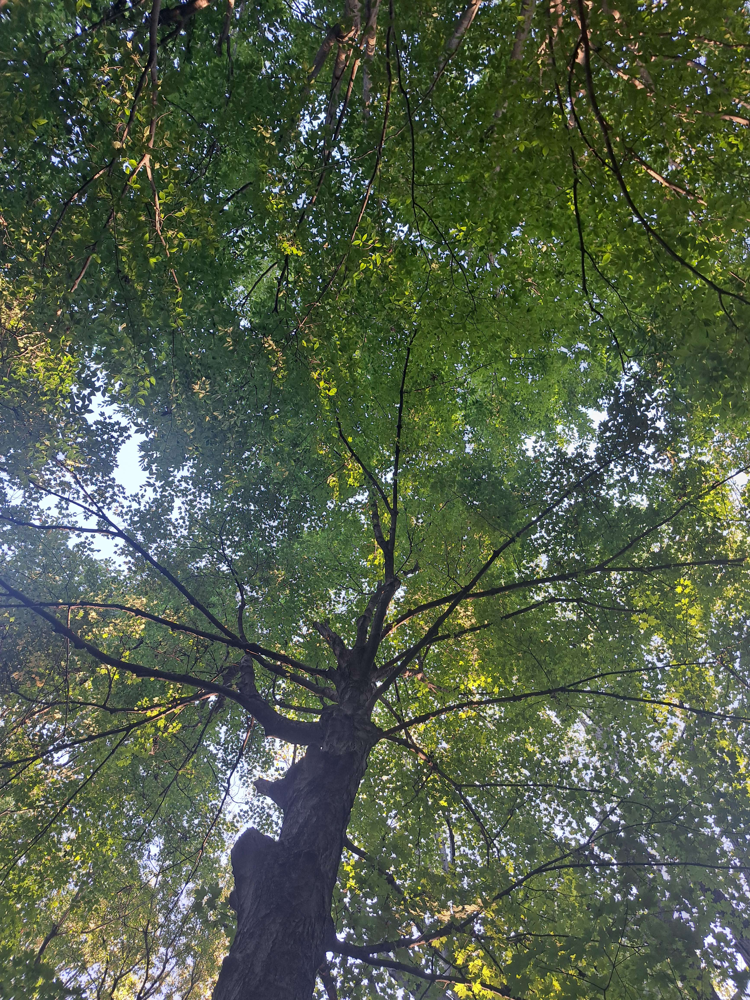

In [ ]:
display(Image(filename='/content/gdrive/MyDrive/CS 430/Project/Pictures/CanopyOverView.jpg'))

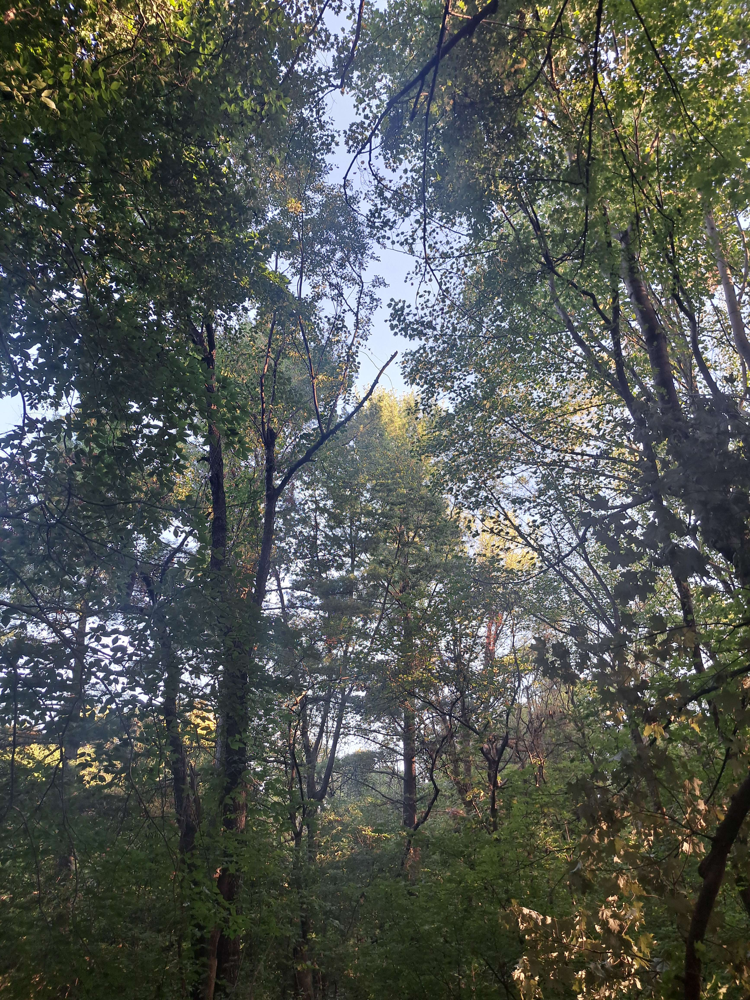

In [ ]:
display(Image(filename='/content/gdrive/MyDrive/CS 430/Project/Pictures/CanopyInDistance.jpg'))

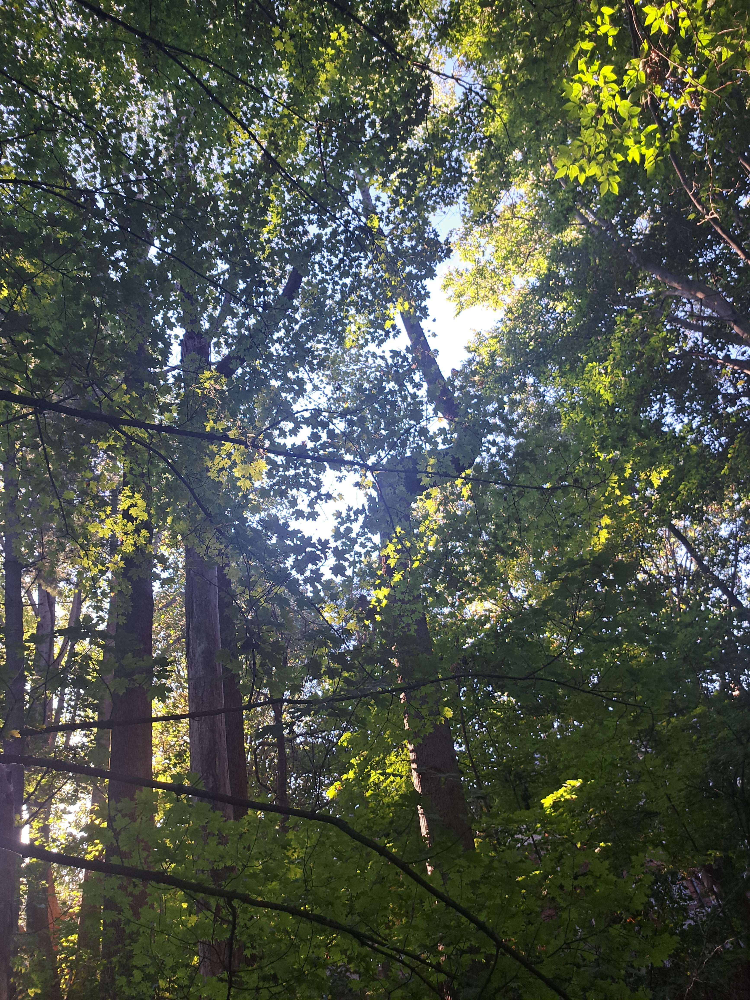

In [ ]:
display(Image(filename='/content/gdrive/MyDrive/CS 430/Project/Pictures/MoreCanopy.jpg'))

### Example of Undergrowth
This examples shows a bunch of maple sapling growing up under the adult trees

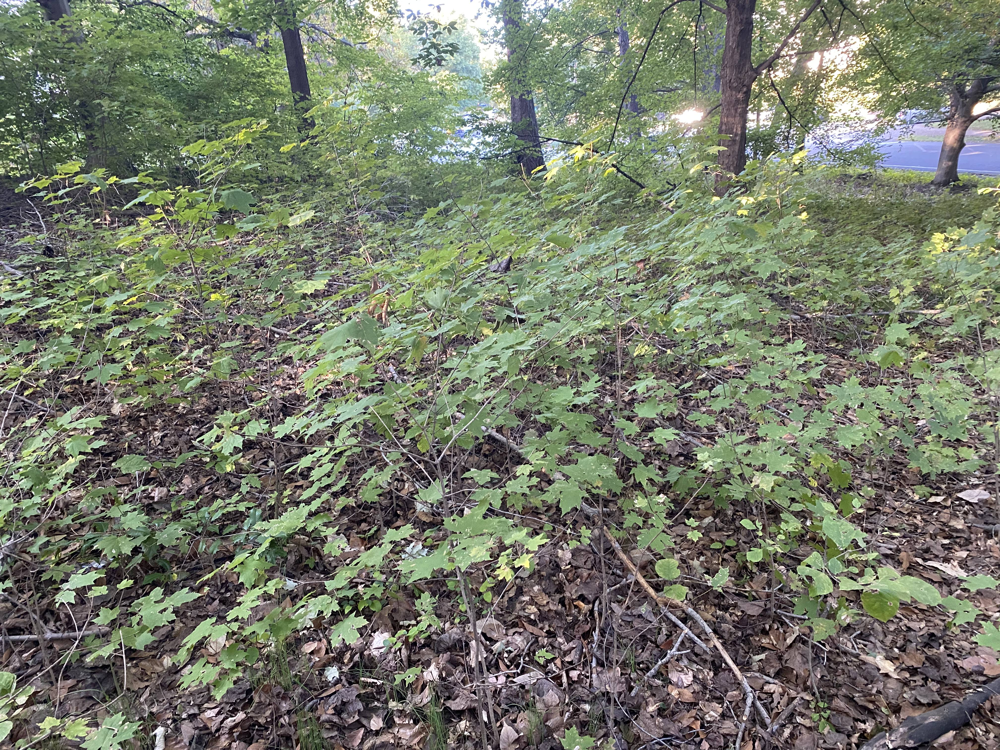

In [ ]:
display(Image(filename='/content/gdrive/MyDrive/CS 430/Project/Pictures/UndergrowthExample_(1).jpg'))

### Statistical and Visual Exploration

In [ ]:
# Summarizes the numerical columns of data
df.describe()

,Trimble_Station,N,E,S,W,PONCBC,AverageCanopyCover,MCSC_Ash,MCSC_Basswood,MCSC_Beech,...,POIS_CelastrusOrbiculatus,POIS_VincaMinor,POIS_EuonymusFortunei,POIS_AkebiaQuinata,POIS_Achyranthes,POIS_HedereaHelix,POIS_LMaackii,POIS_Privet_or_Ligustrum,POIS_Ailanthus,POIS_CanGapORDownTrees
count,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.00000,...,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000
mean,87.518293,11.524390,12.054878,11.445122,11.054878,11.983252,88.016748,0.189024,0.085366,0.20122,...,0.512195,0.207317,2.719512,0.085366,0.640244,1.170732,1.646341,0.231707,0.060976,0.567073
std,49.725192,13.397395,16.550445,15.284722,15.894303,13.166574,13.166574,0.392727,0.280281,0.40214,...,0.889529,0.704722,1.284876,0.524287,0.952151,1.304122,1.037599,0.526565,0.326632,1.057437
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.760000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,44.750000,3.000000,3.000000,3.000000,3.000000,4.095000,85.635000,0.000000,0.000000,0.00000,...,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,87.500000,8.000000,6.500000,7.000000,6.000000,7.800000,92.200000,0.000000,0.000000,0.00000,...,0.000000,0.000000,3.000000,0.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000
75%,130.250000,15.250000,13.000000,12.000000,13.000000,14.365000,95.905000,0.000000,0.000000,0.00000,...,1.000000,0.000000,4.000000,0.000000,1.000000,2.000000,2.000000,0.000000,0.000000,1.000000
max,173.000000,94.000000,96.000000,92.000000,96.000000,97.240000,100.000000,1.000000,1.000000,1.00000,...,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,4.000000,3.000000,3.000000,4.000000


### Bar graphs

In [ ]:
MCSC_data = df.loc[:, df.columns.str.startswith('MCSC_')]
MCSU_data = df.loc[:, df.columns.str.startswith('MCSU_')]
#MCSC_data.head()
#MCSU_data.head()

In [ ]:
# Creating Cannopy Tree Species Data
Canopy_Tree = MCSC_data.sum().sort_values(ascending=False)
Canopy_Tree = pd.DataFrame({'Tree_Species': Canopy_Tree.index, 'Count': Canopy_Tree.values})
Canopy_Tree['Tree_Species'] = Canopy_Tree['Tree_Species'].replace('MCSC_', '', regex=True)
Canopy_Tree['Tree_Species'].unique()

array(['Maple', 'Hackberry', 'Walnut', 'Tulippoplar', 'Sycamore',
       'Cherry', 'Beech', 'BoxElder', 'Ash', 'Sugarmaple', 'Elm',
       'Redoak', 'Hickory', 'Oak', 'BlackLocust', 'Basswood', 'Locust',
       'Mulberry', 'Chinquapinoak', 'Whiteoak', 'Deadash', 'Ironwood',
       'Cottonwood', 'Pinoak', 'Sassafrass', 'Whitepine', 'Pawpaw',
       'Sugarberry', 'Carya', 'Buckeye', 'Silvermaple', 'Paulowniamaple',
       'Linden', 'Yellowwood'], dtype=object)

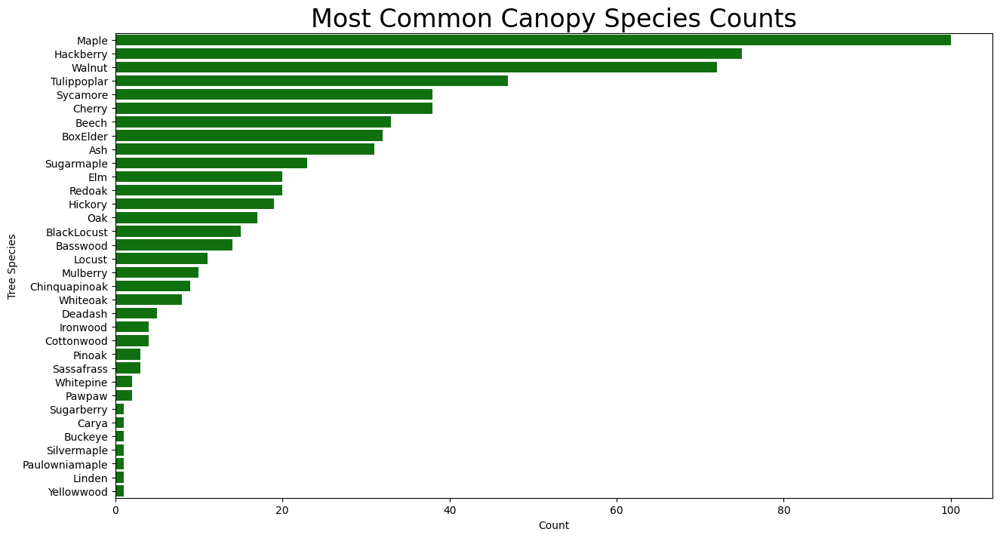

In [ ]:
# create bar graph of Canopy Tree Species
plt.figure(figsize=(15, 8))
sns.barplot(y=Canopy_Tree['Tree_Species'], x=Canopy_Tree['Count'], orient='h', color='green')
plt.title('Most Common Canopy Species Counts', fontsize=24)
plt.xlabel('Count')
plt.ylabel('Tree Species')
plt.show()


### Meaningful Insights
Maple is the most common type of canopy species with them being one of the most common species at 100 out of 164 trimble stations. Hackberry and Walnut are the second and third for most common canopy species.

In [ ]:
# Creating Undergrowth Species Data
Undergrowth_Tree = MCSU_data.sum().sort_values(ascending=False)
Undergrowth_Tree = pd.DataFrame({'Tree_Species': Undergrowth_Tree.index, 'Count': Undergrowth_Tree.values})
Undergrowth_Tree['Tree_Species'] = Undergrowth_Tree['Tree_Species'].replace('MCSU_', '', regex=True)
Undergrowth_Tree['Tree_Species'].unique()


array(['Ash', 'Boxelder', 'Maple', 'Pawpaw', 'Spicebush', 'Buckeye',
       'Redbud', 'Hackberry', 'Holly', 'Sugarmaple', 'Tulippoplar',
       'Dogwood', 'Coralberry', 'Elm', 'Viburnum', 'Elderberry',
       'Hickory', 'Oak', 'Mulberry', 'Cercis', 'Beech', 'Juniper',
       'Cherry', 'Blackberry', 'Redoak', 'Basswood', 'Sassafrass',
       'Carya', 'Walnut', 'Ironwood', 'Berry', 'Blackcherry',
       'Devilswalkingstick', 'Rhamnus', 'Blacklocust', 'Chinquapinoak',
       'Sumac', 'Butternut', 'Buckthorn', 'Bladdernut', 'Nativeeuonymus',
       'Snakeroot', 'Nettles', 'Sugarberry', 'Redelm', 'Prunus',
       'Ailanthus', 'Nativecane', 'Coral', 'Ashand', 'Bitternut',
       'Blackmaple', 'Buttonbush', 'Catalpa', 'Coffeetree', 'Cornusmas',
       'Myrtle', 'Crepe', 'Ginkgo', 'Honeysuckle', 'Linderabenzoin',
       'Lonicera', 'Mock', 'Yellowwood'], dtype=object)

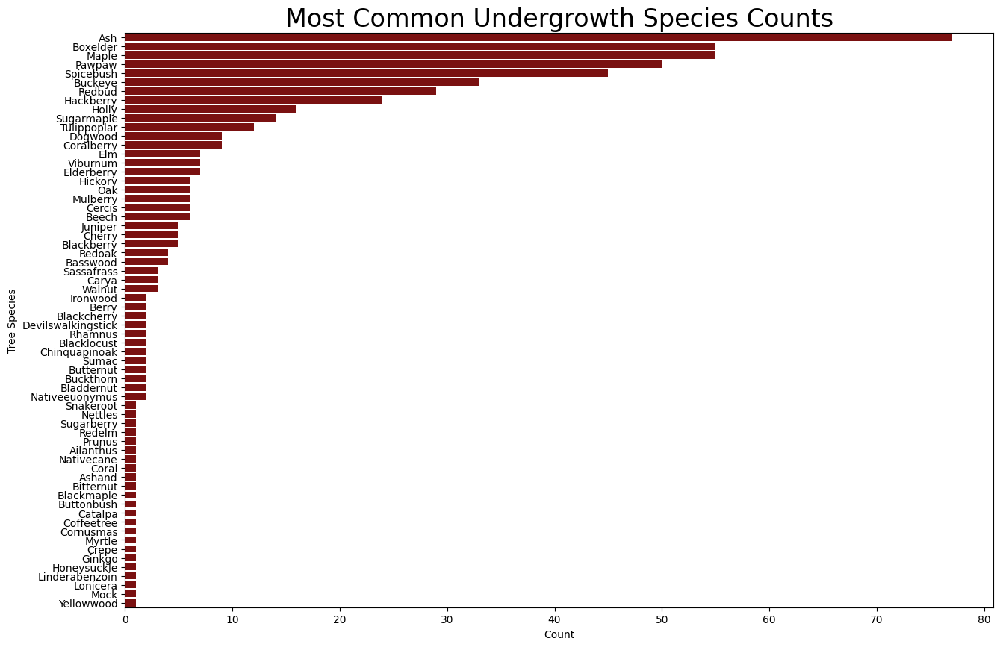

In [ ]:
# create bar graph of Undergrowth Species
plt.figure(figsize=(15, 10))
sns.barplot(y=Undergrowth_Tree['Tree_Species'], x=Undergrowth_Tree['Count'], orient='h', color='darkred')
plt.title('Most Common Undergrowth Species Counts', fontsize=24)
plt.xlabel('Count')
plt.ylabel('Tree Species')
plt.show()


### Meaningful Insights
Ash is the most common type of undergrowth species with them being one of the most common species at 75 out of 164 trimble stations. Boxelder and Maple are the second and third for most common canopy species.

### Histograms

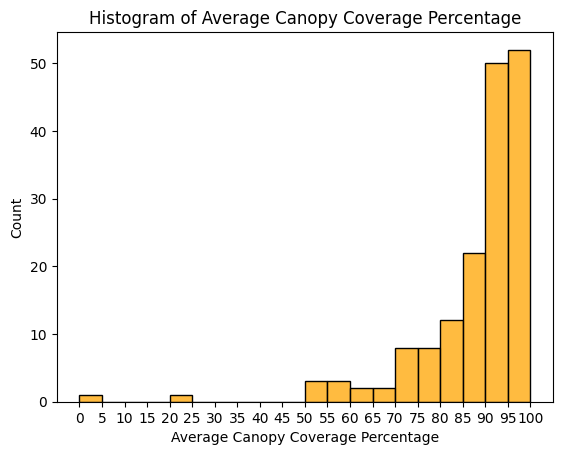

In [ ]:
# Creating a histogram binned by 5 of AverageCanopyCover
sns.histplot(df['AverageCanopyCover'], bins=range(0, 101, 5), color='Orange')
plt.title('Histogram of Average Canopy Coverage Percentage')
plt.xticks(np.arange(0, 101, 5))
plt.xlabel('Average Canopy Coverage Percentage')
plt.ylabel('Count')
plt.show()

### Meaningful Insights
In Cherokee Park, most trimble stations have at least 85% average canopy coverage. The data set is left skewed.

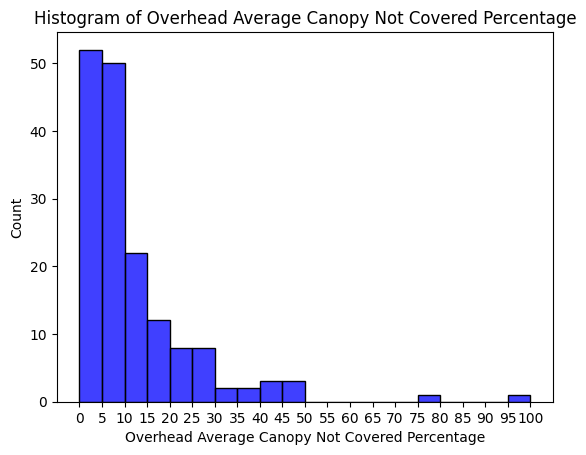

In [ ]:
# Creating a histogram binned by 5 of PONCBC for comparison
sns.histplot(df['PONCBC'], bins=range(0, 101, 5), color='Blue')
plt.title('Histogram of Overhead Average Canopy Not Covered Percentage')
plt.xticks(np.arange(0, 101, 5))
plt.xlabel('Overhead Average Canopy Not Covered Percentage')
plt.ylabel('Count')
plt.show()

#planning to drop the PONCBC column

### Meaningful Insights
This data set is a perfect mirror of the histogram above and is the exact opposite of it. We are planning to drop this column since it is so directly correlated to the average canopy coverage.

### Heatmaps

In [ ]:
#Creating Numerical Variables
MCSC_Col_List = MCSC_data.columns.tolist()
MCSU_Col_List = MCSU_data.columns.tolist()
Cat_Col_List = MCSC_Col_List + MCSU_Col_List

num_data = df.drop(Cat_Col_List, axis=1)
#num_data.head()

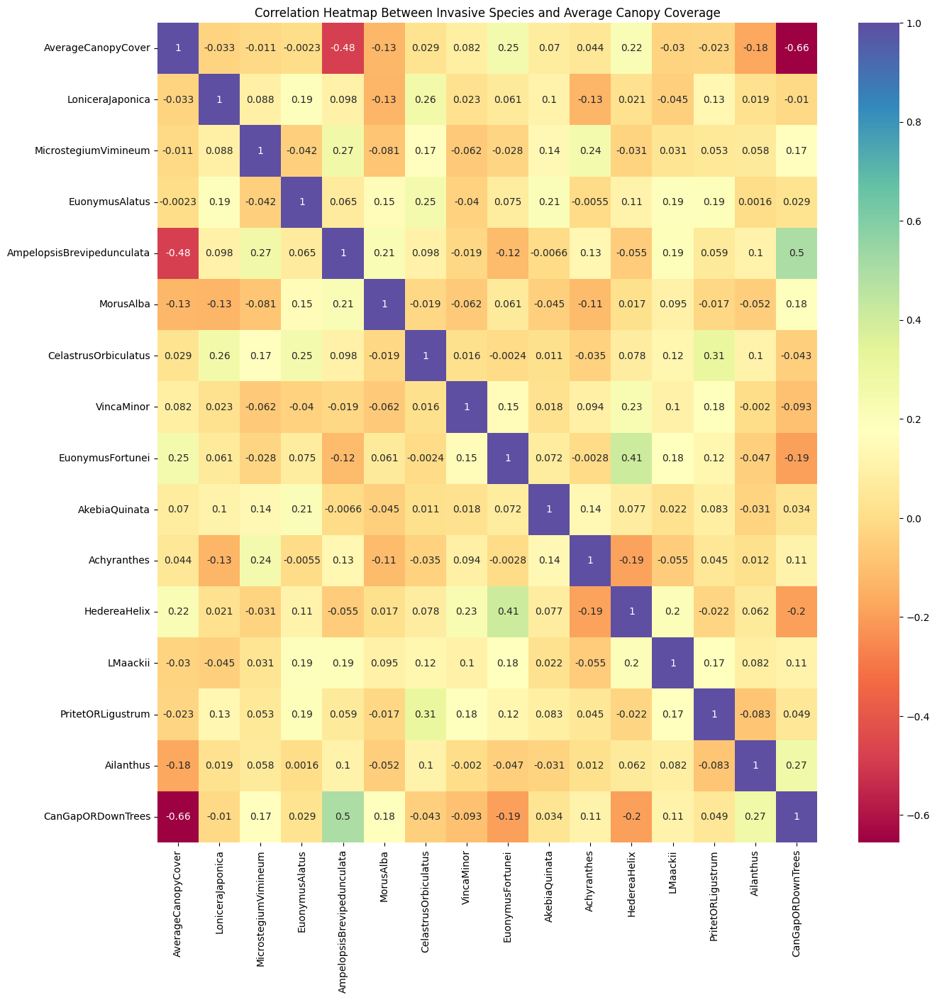

In [ ]:
# Creating data for heat map
corr_data = num_data.drop(['Trimble_Station', 'N', 'E', 'S', 'W', 'PONCBC'], axis=1)
corr_data.columns = corr_data.columns.str.replace('POIS_', '', regex=False)
corr_data = corr_data.rename(columns={'Privet_or_Ligustrum': 'PritetORLigustrum'})

#Creating the Heatmap between invasive species and Average Canopy Coverage
plt.figure(figsize=(15, 15))
sns.heatmap(corr_data.corr(), annot=True, cmap='Spectral')
plt.title('Correlation Heatmap Between Invasive Species and Average Canopy Coverage')
plt.show()


### Meaningful Insights
There were not many strong or moderate correlations between AverageCanopyCover and other invasive species. However there were a few and a few correlations between each species. For making explanations easier, the following are the common names for each signifgant group of invasive species: ampelopsis brevipedunculata is porcelain vine, hedera helix is english ivy and euonymus fortunei is also known as wintercreeper. Porcelain vines tend to grow where there are gaps in the canapy or there are downed trees. This would explain the strong negative correlation that it has with AverageCanopyCover. English ivy and wintercreeper also have a moderate correlation and english ivy even has a weak positive correlation with AverageCanopyCover. This means that if you are going to have english ivy in an area then you will most likely find wintercreeper.


In [ ]:
#creating heat map between top 10 canopy trees and average canopy cover
Top10Canopy = Canopy_Tree.head(10)
Top10CanopyList = Top10Canopy['Tree_Species'].unique().tolist()
Canopy_list = [f'MCSC_{obj}' for obj in Top10CanopyList]
Canopy_list.insert(0,'AverageCanopyCover')
#print(Canopy_list)

#Creating correlation data
canopy_corr_data = df[Canopy_list]
canopy_corr_data.columns = canopy_corr_data.columns.str.replace('MCSC_', '', regex=False)
canopy_corr_data.head(1)

,AverageCanopyCover,Maple,Hackberry,Walnut,Tulippoplar,Sycamore,Cherry,Beech,BoxElder,Ash,Sugarmaple
0,59.7,1,1,1,0,0,1,0,0,1,0


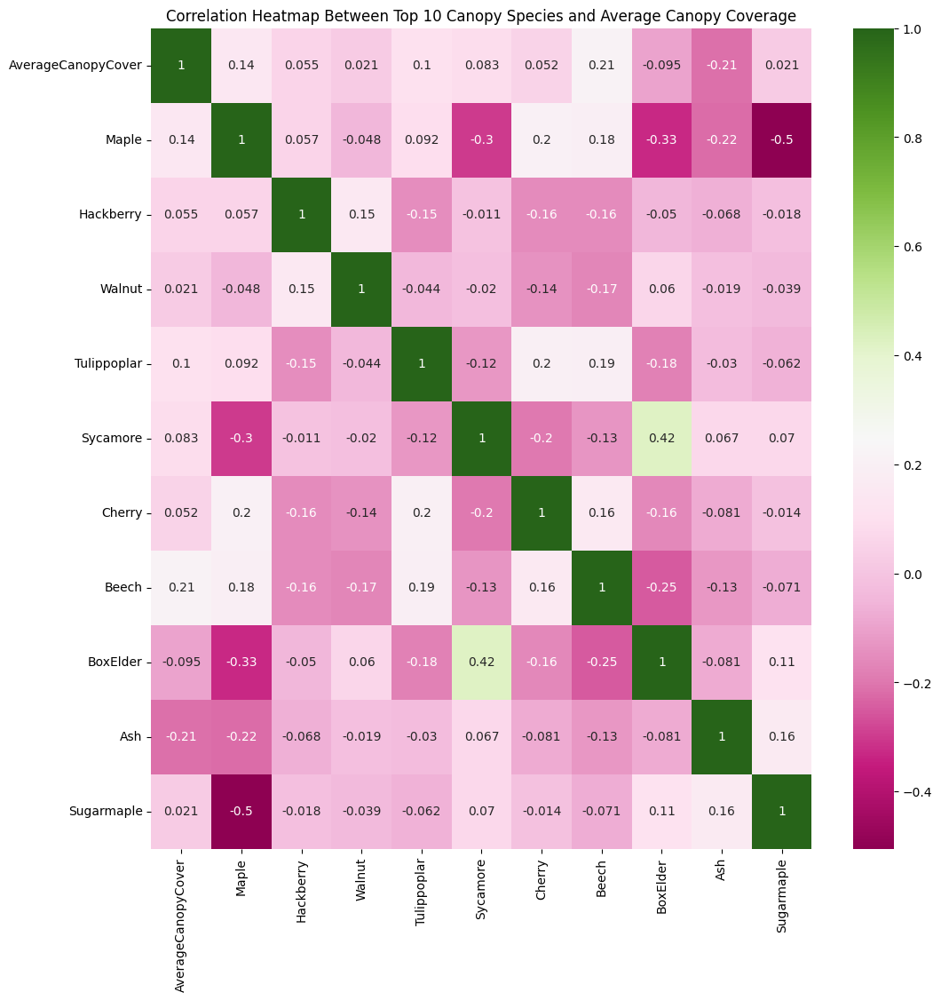

In [ ]:
#Creating heatmap for canopy coverage
plt.figure(figsize=(12, 12))
sns.heatmap(canopy_corr_data.corr(), annot=True, cmap='PiYG')
plt.title('Correlation Heatmap Between Top 10 Canopy Species and Average Canopy Coverage')
plt.show()

### Meaningful Insights
The type of tree did not seem to have any strong correlation with AverageCanopyCover, meaning the type of tree in the canopy didn't seem to matter. However there is a moderate correlation between sycamore and elder box trees in the canopy space. This means that these trees are more likely to be found together at a trimble station. This could suggest that these two trees grow in the same places together well.

In [ ]:
#creating heat map between top 10 canopy trees and average canopy cover
Top10Undergrowth = Undergrowth_Tree.head(10)
Top10Undergrowth = Top10Undergrowth['Tree_Species'].unique().tolist()
Undergrowth_list = [f'MCSU_{obj}' for obj in Top10Undergrowth]
Undergrowth_list.insert(0,'AverageCanopyCover')
#print(Canopy_list)

#Creating correlation data
undergrowth_corr_data = df[Undergrowth_list]
undergrowth_corr_data.columns = undergrowth_corr_data.columns.str.replace('MCSU_', '', regex=False)
undergrowth_corr_data.head(1)

,AverageCanopyCover,Ash,Boxelder,Maple,Pawpaw,Spicebush,Buckeye,Redbud,Hackberry,Holly,Sugarmaple
0,59.7,0,1,0,0,0,0,0,0,0,1


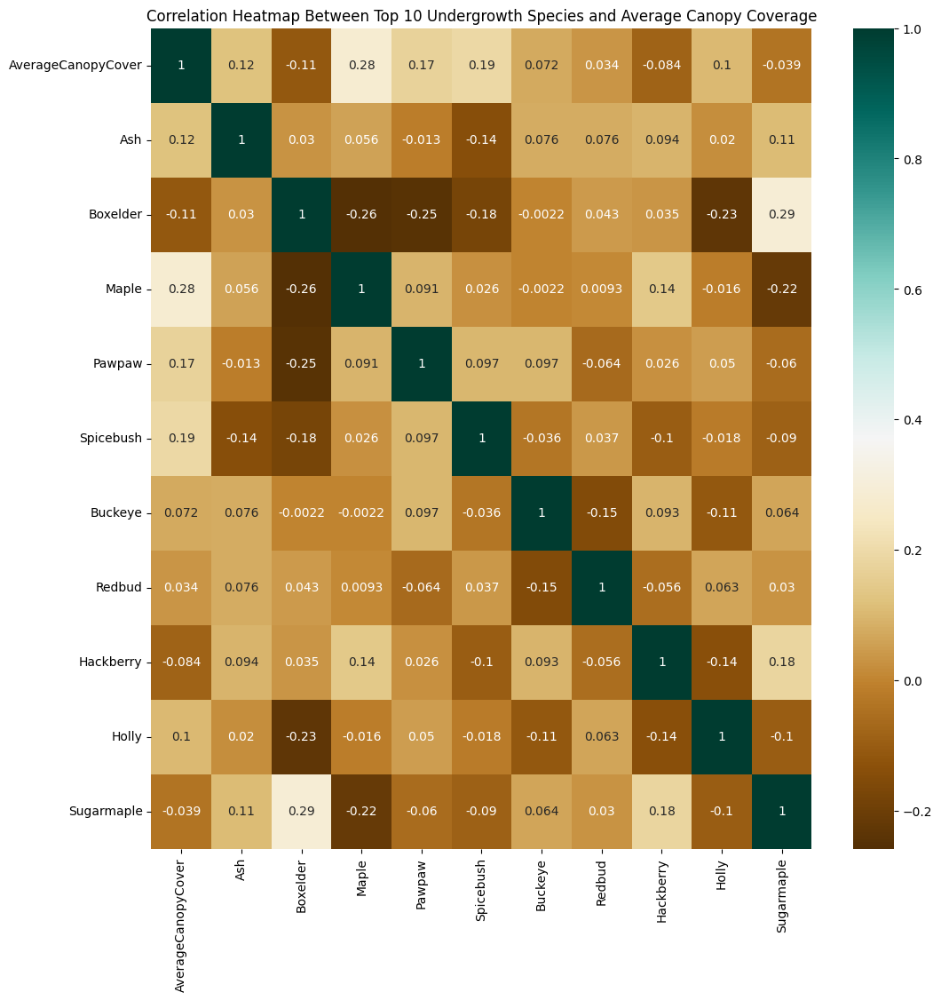

In [ ]:
#Creating heatmap for Undergrowth
plt.figure(figsize=(12, 12))
sns.heatmap(undergrowth_corr_data.corr(), annot=True, cmap='BrBG')
plt.title('Correlation Heatmap Between Top 10 Undergrowth Species and Average Canopy Coverage')
plt.show()

### Meaningful Insights
No strong correlations between the top 10 undergrowth species and average canopy coverage. There is a weak positive correlation between box elder and sugar maple saplings. Box elder saplings seem to be less likely found around spice bushes, paw paw saplings, and maple saplings.


### Conclusions
We found that the top 10 most common canopy species were as follows: Maple, Hackberry, Walnut, Tulippoplar, Sycamore, Cherry, Beech, Box Elder, Ash and Sugarmaple. However when looking at the correlations between the top 10 trees and average canopy covarge, there were no strong correlations found between the two.

When looking closer at the correlation matrix you will see that sycamore trees and elder box trees have a moderate correlation. Elder box trees canopies tend to be more vertical while sycamore's tends to be more horizontal. These canopy shapes tend to compliment each other meaning that they would be able to more efficiently fill in the canopy space. If there was an effort to plant trees to make up for canopy space then these two trees might be a good combination.

Similar results were found when looking at the undergrowth as well. When looking at the invasive species however, We found that having a tree downed and Ampelopsis Brevipedunculata, commonly known as the porcelain vine, have moderate negative correlations with average canopy coverage. Considering the english ivy and the wintercreeper too, the invasive species that tend to be together could potientally be easier to treat. Another possibility is that the treatment for the invasive speices that tend to be found together could be different meaning only one is being treated. From this EDA we think that the type of invasive species present will have the most signifigant factor in canopy coverage. We do not think that undergrowth will play a signifigant factor and the type of tree in the canopy will also not have a signifigant effect.